<a href="https://colab.research.google.com/github/Mike030668/MIPT_magistratura/blob/main/ModNet%20/Image_Bind/Image_Bind_manipulations_based.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Installation

https://github.com/softmurata/colab_notebooks/blob/main/multimodality/imagebind.ipynb

https://colab.research.google.com/drive/1D3hlz-742A8aNSREpKZXHLE6PvTpyfVJ?hl=ja#scrollTo=xZJxeJXTGXSg

In [1]:
!git clone https://github.com/facebookresearch/ImageBind.git
!pip install git+https://github.com/facebookresearch/pytorchvideo.git@28fe037d212663c6a24f373b94cc5d478c8c1a1d timm==0.6.7 ftfy regex einops fvcore decord==0.6.0

Cloning into 'ImageBind'...
remote: Enumerating objects: 112, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 112 (delta 43), reused 33 (delta 33), pack-reused 51
Receiving objects: 100% (112/112), 2.64 MiB | 21.61 MiB/s, done.
Resolving deltas: 100% (50/50), done.
  Cloning https://github.com/facebookresearch/pytorchvideo.git (to revision 28fe037d212663c6a24f373b94cc5d478c8c1a1d) to /tmp/pip-req-build-676molpp
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/pytorchvideo.git /tmp/pip-req-build-676molpp
  Running command git rev-parse -q --verify 'sha^28fe037d212663c6a24f373b94cc5d478c8c1a1d'
  Running command git fetch -q https://github.com/facebookresearch/pytorchvideo.git 28fe037d212663c6a24f373b94cc5d478c8c1a1d
  Running command git checkout -q 28fe037d212663c6a24f373b94cc5d478c8c1a1d
  Resolved https://github.com/facebookresearch/pytorchvideo.git to commit 28fe037d212663c6a

Data Checker

In [2]:
%cd /content/ImageBind

/content/ImageBind


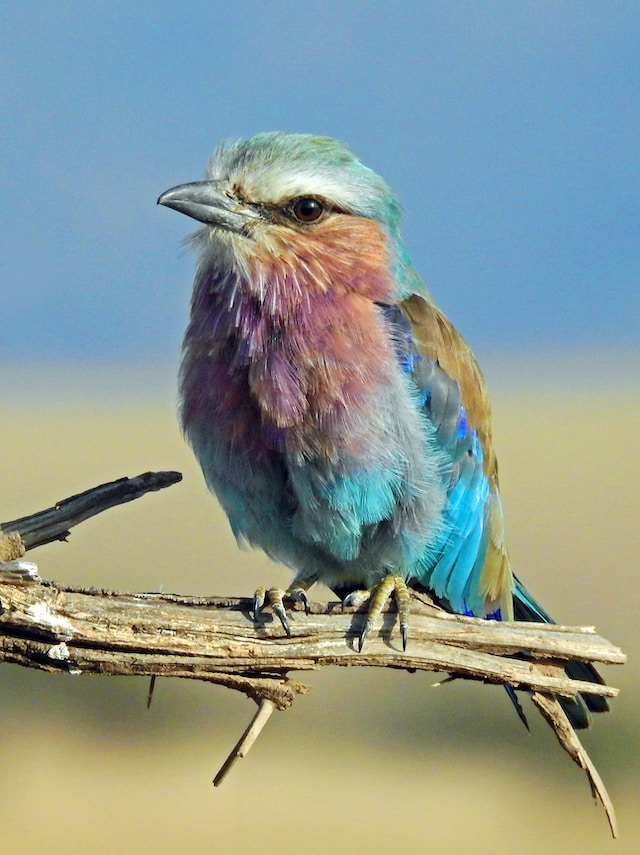

In [3]:
import IPython
from PIL import Image

text = 'bird'
display(Image.open(f".assets/{text}_image.jpg"))
IPython.display.Audio(f".assets/{text}_audio.wav")

Классифиация по косинусному сходтву модальностей

In [4]:
import sys
sys.path.append('/content/ImageBind')
import ImageBind

In [5]:
import imagebind.data as data
import torch
from imagebind.models import imagebind_model
from imagebind.models.imagebind_model import ModalityType

text_list=["A bird", "A car", "A dog."]
image_paths=[".assets/dog_image.jpg", ".assets/car_image.jpg", ".assets/bird_image.jpg"]
audio_paths=[".assets/dog_audio.wav", ".assets/car_audio.wav", ".assets/bird_audio.wav"]

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# Instantiate model
model = imagebind_model.imagebind_huge(pretrained=True)
model.eval()
model.to(device)

# Load data
inputs = {
    ModalityType.TEXT: data.load_and_transform_text(text_list, device),
    ModalityType.VISION: data.load_and_transform_vision_data(image_paths, device),
    ModalityType.AUDIO: data.load_and_transform_audio_data(audio_paths, device),
}

with torch.no_grad():
    embeddings = model(inputs)

print()

print(
    "Vision x Text:\n ",
    torch.softmax(embeddings[ModalityType.VISION] @ embeddings[ModalityType.TEXT].T, dim=-1),
    '\n'
)
print(
    "Audio x Text:\n ",
    torch.softmax(embeddings[ModalityType.AUDIO] @ embeddings[ModalityType.TEXT].T, dim=-1),
    '\n'
)
print(
    "Vision x Audio:\n ",
    torch.softmax(embeddings[ModalityType.VISION] @ embeddings[ModalityType.AUDIO].T, dim=-1),
    '\n'
)


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional_tensor.py:5: UserWarning: The torchvision.transforms.functional_tensor module is deprecated in 0.15 and will be **removed in 0.17**. Please don't rely on it. You probably just need to use APIs in torchvision.transforms.functional or in torchvision.transforms.v2.functional.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(


100%|██████████| 4.47G/4.47G [00:23<00:00, 202MB/s]



Vision x Text:
  tensor([[1.8612e-05, 2.3694e-03, 9.9761e-01],
        [2.4118e-05, 9.9994e-01, 3.3837e-05],
        [9.8646e-01, 1.3496e-02, 4.7997e-05]], device='cuda:0') 

Audio x Text:
  tensor([[0., 0., 1.],
        [0., 1., 0.],
        [1., 0., 0.]], device='cuda:0') 

Vision x Audio:
  tensor([[0.8070, 0.1088, 0.0842],
        [0.1036, 0.7884, 0.1079],
        [0.0018, 0.0022, 0.9960]], device='cuda:0') 



Тут видна классификация выходов имбедингов моделей соответствующих модальностей по косинусному сходству.

И результаты очень высокие

# Добавление модальности глубины изображения
на основе модели Depth

In [6]:
!pip install transformers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 35.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 81.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 36.9 MB/s eta 0:00:00


# depth estimator

In [7]:
# depth estimator
# https://huggingface.co/spaces/nielsr/dpt-depth-estimation/blob/main/app.py
from transformers import DPTFeatureExtractor, DPTForDepthEstimation
import torch
import numpy as np
import PIL
import matplotlib.pyplot as plt
%matplotlib inline

In [8]:
feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-large")
model_dpt = DPTForDepthEstimation.from_pretrained("Intel/dpt-large")

/usr/local/lib/python3.10/dist-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(


Some weights of DPTForDepthEstimation were not initialized from the model checkpoint at Intel/dpt-large and are newly initialized: ['neck.fusion_stage.layers.0.residual_layer1.convolution1.bias', 'neck.fusion_stage.layers.0.residual_layer1.convolution1.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.weight', 'neck.fusion_stage.layers.0.residual_layer1.convolution2.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


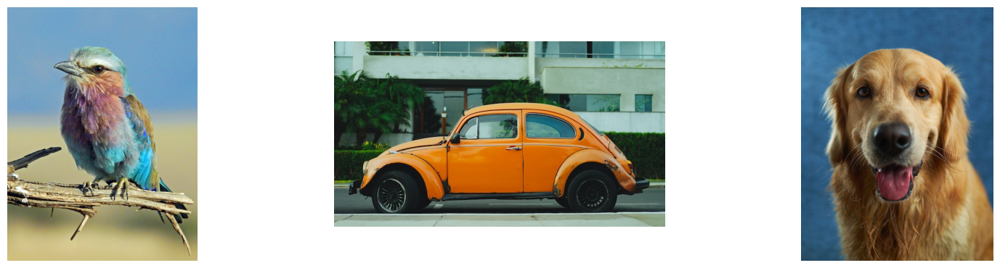

In [9]:
pil_images = []
texts = ("bird", "car", "dog")

for text in texts:
  pil_img = PIL.Image.open(f"/content/ImageBind/.assets/{text}_image.jpg")
  pil_images.append(pil_img)

plt.figure(figsize=(20,10))
columns = 3
for i, image in enumerate(pil_images):
    plt.subplot(int(len(pil_images) / columns + 1), columns, i + 1)
    plt.imshow(image)
    plt.axis(False)

## feature_extractor

In [10]:
encoding = feature_extractor(pil_images, return_tensors="pt")
encoding['pixel_values'].shape

torch.Size([3, 3, 384, 384])

In [11]:
encoding

{'pixel_values': tensor([[[[-0.0902, -0.0824, -0.0588,  ..., -0.1216, -0.1294, -0.1294],
          [-0.0980, -0.0902, -0.0902,  ..., -0.1216, -0.1294, -0.1216],
          [-0.1059, -0.0902, -0.0902,  ..., -0.1137, -0.0980, -0.0902],
          ...,
          [ 0.6471,  0.6471,  0.6471,  ...,  0.4980,  0.4980,  0.5137],
          [ 0.6314,  0.6314,  0.6392,  ...,  0.5059,  0.5137,  0.5216],
          [ 0.6235,  0.6314,  0.6314,  ...,  0.5137,  0.5294,  0.5216]],

         [[ 0.2706,  0.2784,  0.2863,  ...,  0.2706,  0.2784,  0.2784],
          [ 0.2863,  0.2941,  0.2863,  ...,  0.2706,  0.2627,  0.2627],
          [ 0.3098,  0.3098,  0.3020,  ...,  0.2784,  0.2706,  0.2706],
          ...,
          [ 0.5137,  0.5137,  0.5137,  ...,  0.4118,  0.4039,  0.4118],
          [ 0.5059,  0.4980,  0.5059,  ...,  0.4196,  0.4196,  0.4118],
          [ 0.5137,  0.5137,  0.4980,  ...,  0.4275,  0.4196,  0.4118]],

         [[ 0.5529,  0.5529,  0.5529,  ...,  0.5686,  0.5765,  0.5922],
          [ 0

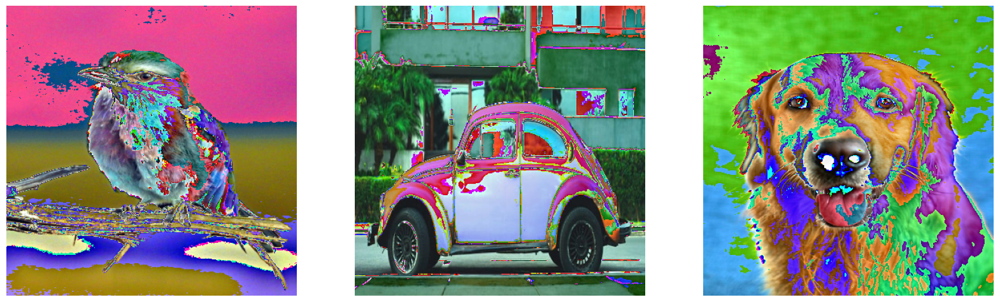

In [12]:
plt.figure(figsize=(20,10))
columns = 3
for i, image in enumerate(encoding['pixel_values']):
    plt.subplot(int(len(encoding) / columns + 1), columns, i + 1)
    output = image.permute((1,2,0)).numpy()
    formatted = (output * 255 / np.max(output)).astype('uint8')
    plt.imshow(formatted)
    plt.axis(False)

# predicted_depth

In [13]:
# forward pass
with torch.no_grad():
  outputs = model_dpt(**encoding)
  predicted_depth = outputs.predicted_depth

outputs

DepthEstimatorOutput(loss=None, predicted_depth=tensor([[[ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
         ...,
         [ 2.4694,  2.4936,  2.5510,  ...,  6.5319,  6.6106,  6.7245],
         [ 2.7084,  2.5873,  2.5975,  ...,  6.5541,  6.6683,  6.7765],
         [ 2.9785,  2.6659,  2.7153,  ...,  7.1571,  7.5714,  8.1808]],

        [[ 5.4926,  5.4702,  5.4601,  ...,  2.6798,  2.6994,  2.6633],
         [ 5.4795,  5.4530,  5.4554,  ...,  2.6734,  2.6800,  2.6463],
         [ 5.4643,  5.4690,  5.4560,  ...,  2.6739,  2.6864,  2.6401],
         ...,
         [28.8224, 28.9397, 28.8803,  ..., 27.2783, 27.2433, 27.2049],
         [29.1171, 29.1072, 29.1180,  ..., 27.4487, 27.3961, 27.3426],
         [29.2608, 29.2756, 29.2406,  ..., 27.5416, 27.5207, 27.3783]],

        [[ 0.1601,  0.1487,  0.1422,  ...,  0.7291,  0.7396,  0.8400

In [14]:
predicted_depth.shape

torch.Size([3, 384, 384])

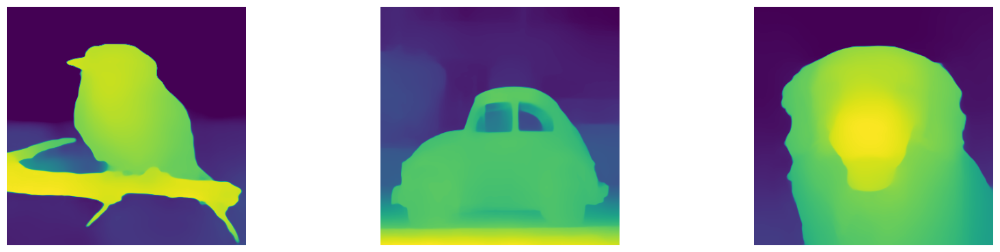

In [15]:
plt.figure(figsize=(20,10))
columns = 3
for i, (output, text) in enumerate(zip(predicted_depth, texts)):
    plt.subplot(int(len(predicted_depth) / columns + 1), columns, i + 1)
    output = output.cpu().numpy()
    formatted = (output * 255 / np.max(output)).astype('uint8')
    plt.imshow(formatted) #, cmap = 'gray')
    plt.axis(False)
    pred_img = Image.fromarray(formatted)
    pred_img.save(f"/content/ImageBind/.assets/{text}_depth.jpg")

# Cross modality

In [16]:
from torchvision import transforms
from PIL import Image
def load_and_transform_depth_data(depth_paths, device):
    if depth_paths is None:
        return None

    depth_ouputs = []
    for depth_path in depth_paths:
        data_transform = transforms.Compose(
            [
                transforms.Resize(
                    224, interpolation=transforms.InterpolationMode.BICUBIC
                ),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
                transforms.Normalize((0.5, ), (0.5, ))
            ]
        )
        with open(depth_path, "rb") as fopen:
            image = Image.open(fopen).convert("L")

        image = data_transform(image).to(device)
        depth_ouputs.append(image)
    return torch.stack(depth_ouputs, dim=0)

In [17]:
import imagebind.data as data
import torch
from imagebind.models import imagebind_model
from imagebind.models.imagebind_model import ModalityType

text_list=["A dog.", "A car", "A bird"]

image_paths=[".assets/dog_image.jpg", ".assets/car_image.jpg", ".assets/bird_image.jpg"]
audio_paths=[".assets/dog_audio.wav", ".assets/car_audio.wav", ".assets/bird_audio.wav"]
depth_paths = [".assets/dog_depth.jpg", ".assets/car_depth.jpg", ".assets/bird_depth.jpg"]

device = "cuda:0" if torch.cuda.is_available() else "cpu"

# Instantiate model
model = imagebind_model.imagebind_huge(pretrained=True)
model.eval()
model.to(device)

# Load data
inputs = {
    ModalityType.TEXT: data.load_and_transform_text(text_list, device),
    ModalityType.VISION: data.load_and_transform_vision_data(image_paths, device),
    ModalityType.AUDIO: data.load_and_transform_audio_data(audio_paths, device),
    ModalityType.DEPTH: load_and_transform_depth_data(depth_paths, device),
}


with torch.no_grad():
    embeddings = model(inputs)


print()

print(
    "Vision x DEPTH:\n ",
    torch.softmax(embeddings[ModalityType.VISION] @ embeddings[ModalityType.DEPTH].T, dim=-1),
    '\n'
)
print(
    "Audio x DEPTH:\n ",
    torch.softmax(embeddings[ModalityType.AUDIO] @ embeddings[ModalityType.DEPTH].T, dim=-1),
    '\n'
)
print(
    "Text x DEPTH:\n ",
    torch.softmax(embeddings[ModalityType.TEXT] @ embeddings[ModalityType.DEPTH].T, dim=-1),
    '\n'
)


Vision x DEPTH:
  tensor([[0.3961, 0.3022, 0.3017],
        [0.3158, 0.2894, 0.3948],
        [0.3677, 0.3096, 0.3227]], device='cuda:0') 

Audio x DEPTH:
  tensor([[9.9911e-01, 3.8874e-04, 5.0175e-04],
        [3.6153e-03, 8.6820e-05, 9.9630e-01],
        [9.0697e-01, 7.1055e-05, 9.2962e-02]], device='cuda:0') 

Text x DEPTH:
  tensor([[9.4310e-02, 3.7867e-07, 9.0569e-01],
        [9.7647e-02, 5.4399e-07, 9.0235e-01],
        [8.0348e-01, 1.0307e-04, 1.9642e-01]], device='cuda:0') 



Видно, что с модальностью глубины нет такой четкости в классификации нежели с модальностями выше протестироваными.

In [18]:
embeddings

{'text': tensor([[-1.0745, -4.0049, -1.0697,  ...,  2.2909, -5.3078, -1.9847],
         [-0.4342, -0.9050, -4.2879,  ...,  3.6109, -3.5757, -1.1599],
         [-1.3476, -1.5732, -0.7386,  ...,  3.0858, -2.6202,  0.5023]],
        device='cuda:0'),
 'vision': tensor([[ 0.0020, -0.0281,  0.0052,  ...,  0.0134,  0.0024,  0.0146],
         [ 0.0259,  0.0054,  0.0399,  ..., -0.0253, -0.0048, -0.0196],
         [ 0.0186,  0.0058,  0.0546,  ...,  0.0043,  0.0096, -0.0092]],
        device='cuda:0'),
 'audio': tensor([[-0.0282, -0.4923,  1.0057,  ...,  0.3342, -0.1340, -0.6134],
         [ 0.7091,  0.2072, -1.0133,  ...,  0.4945, -0.2343,  0.4717],
         [ 0.2213, -0.2542,  0.3886,  ..., -0.2424,  0.0875,  0.1380]],
        device='cuda:0'),
 'depth': tensor([[ 0.1811,  0.1688, -0.0878,  ..., -0.0713,  0.1847,  0.0437],
         [ 0.2460,  0.1256,  0.0644,  ...,  0.0855,  0.0599, -0.1424],
         [ 0.1022, -0.0269,  0.0160,  ..., -0.1600,  0.0168, -0.0746]],
        device='cuda:0')}

# Интеграция ImageBind и StableUnCLIPImg2ImgPipeline
для генерации на основе имбедингов

https://huggingface.co/docs/diffusers/api/pipelines/stable_unclip

In [18]:
!pip install diffusers -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 14.0 MB/s eta 0:00:00


In [19]:
# лучше освободить место в памяти от модели глубины
del(model_dpt)

In [20]:
import gc
import torch
gc.collect()
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |   4659 MiB |   4734 MiB |  21097 MiB |  16437 MiB |\n|       from large pool |   4635 MiB |   4712 MiB |  19878 MiB |  15243 MiB |\n|       from small pool |     23 MiB |     31 MiB |   1218 MiB |   1194 MiB |\n|---------------------------------------------------------------------------|\n| Active memory         |   4659 MiB |   4734 MiB |  21097 MiB |  16437 MiB |\n|       from large pool |   4635 MiB |   4712 MiB |

## Audio to Image

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

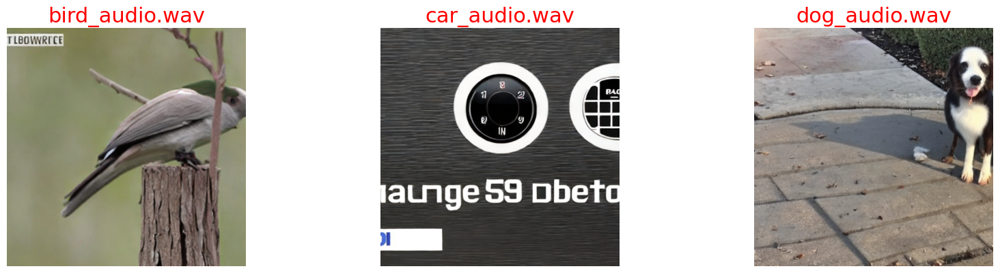

In [21]:
#import imagebind
import imagebind.data as data
from imagebind.models import imagebind_model
from imagebind.models.imagebind_model import ModalityType
import torch
from diffusers import StableUnCLIPImg2ImgPipeline

# construct models
device = "cuda:0" if torch.cuda.is_available() else "cpu"
pipe = StableUnCLIPImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-1-unclip",
    torch_dtype=torch.float16
)
pipe = pipe.to(device)

model = imagebind_model.imagebind_huge(pretrained=True).eval().to(device)

# generate seed image
generator = torch.manual_seed(10)

# generate image
with torch.no_grad():

    audio_paths=[".assets/bird_audio.wav" , ".assets/car_audio.wav", ".assets/dog_audio.wav"]

    embeddings = model.forward({
        ModalityType.AUDIO: data.load_and_transform_audio_data(audio_paths, device),
    })
    embeddings = embeddings[ModalityType.AUDIO]

    gen_images = []
    for emb in embeddings:
        img = pipe(image_embeds=emb[None].half(),
                   generator = generator
        ).images
        gen_images.append(img[0])

plt.figure(figsize=(20,10))
columns = 3
for i, (image, path) in enumerate(zip(gen_images, audio_paths)):
    name = path.split('/')[-1]
    plt.subplot(int(len(gen_images) / columns + 1), columns, i + 1)
    plt.imshow(image)
    plt.title(name, fontdict={'fontsize': 22, 'fontweight': 'medium', 'color':'red'})
    plt.axis(False)

## Audio + Prompt to Image

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

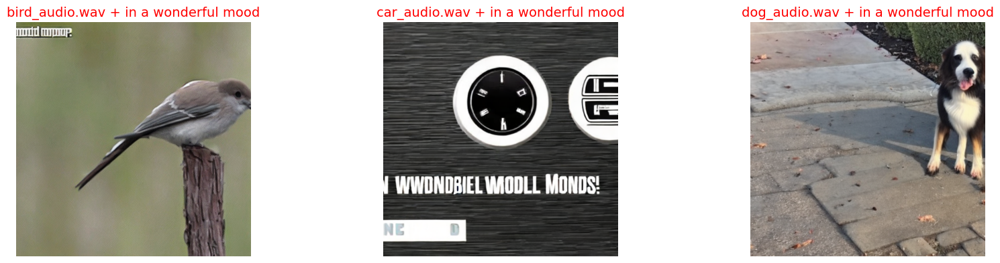

In [34]:
# generate seed image
generator = torch.manual_seed(10)

# generate image
with torch.no_grad():

    audio_paths=[".assets/bird_audio.wav" , ".assets/car_audio.wav", ".assets/dog_audio.wav"]

    embeddings = model.forward({
        ModalityType.AUDIO: data.load_and_transform_audio_data(audio_paths, device),
    })

    audio_embeddings = embeddings[ModalityType.AUDIO]

    gen_images = []
    prompt='in a wonderful mood'

    for emb in audio_embeddings:
        img = pipe(
            prompt=prompt,
            image_embeds=emb[None].half(),
            generator = generator
            ).images
        gen_images.append(img[0])

plt.figure(figsize=(20,10))
columns = 3
for i, (image, path) in enumerate(zip(gen_images, audio_paths)):
    name = path.split('/')[-1]
    plt.subplot(int(len(gen_images) / columns + 1), columns, i + 1)
    plt.imshow(image)
    plt.title(f'{name} + {prompt}', fontdict={'fontsize': 14, 'fontweight': 'medium', 'color':'red'})
    plt.axis(False)

Интересно, что на каждой картинке есть малые изменения и не только в тексте на картинке, но и например в листья или мусоре около сабаки....

Сразу связь и не поймешь, но интересно!

## Audio+Image to Image
https://huggingface.co/facebook/musicgen-large


audio_datasets_colab - https://colab.research.google.com/github/sanchit-gandhi/notebooks/blob/main/audio_datasets_colab.ipynb#scrollTo=958H4DCDhKbT

intro-to-DSP-with-python - https://github.com/earthspecies/intro-to-DSP-with-python

https://colab.research.google.com/github/sanchit-gandhi/notebooks/blob/main/MusicGen.ipynb

### Take audio dataset

In [26]:
!pip install --quiet git+https://github.com/huggingface/transformers.git datasets[audio]

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 493.7/493.7 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 16.6 MB/s eta 0:00:00


In [27]:
from datasets import load_dataset

dataset = load_dataset("sanchit-gandhi/gtzan", split="train", streaming=True)
dataset.info

DatasetInfo(description='', citation='', homepage='', license='', features={'file': Value(dtype='string', id=None), 'audio': Audio(sampling_rate=32000, mono=True, decode=True, id=None), 'genre': ClassLabel(names=['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock'], id=None)}, post_processed=None, supervised_keys=None, task_templates=None, builder_name='parquet', dataset_name='gtzan', config_name='default', version=0.0.0, splits={'train': SplitInfo(name='train', num_bytes=1322941192.0, num_examples=999, shard_lengths=None, dataset_name=None)}, download_checksums=None, download_size=1305519226, post_processing_size=None, dataset_size=1322941192.0, size_in_bytes=None)

In [30]:
dataset.info.features['audio']

Audio(sampling_rate=32000, mono=True, decode=True, id=None)

In [28]:
next(iter(dataset))

{'file': '/home/sanchit/.cache/datasets/downloads/extracted/f729783d70a4541cc4c9d5649655490a9c660280bdbecddfe38a8a806c73f60e/genres/blues/blues.00000.wav',
 'audio': {'path': 'blues.00000.wav',
  'array': array([ 0.0071735 ,  0.01503155,  0.01544898, ..., -0.06676201,
         -0.06880344, -0.02862358]),
  'sampling_rate': 32000},
 'genre': 0}

In [31]:
import IPython.display as ipd

sample = next(iter(dataset))
audio = sample["audio"]
ipd.Audio(data=audio["array"], autoplay=True, rate=audio["sampling_rate"])

In [32]:
import scipy.io.wavfile as wavf
fs = audio["sampling_rate"]
music_name = sample['file'].split('/')[-1]
out_f = '/content/ImageBind/.assets/'+ music_name
res=audio["array"]
wavf.write(out_f, fs, res)

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

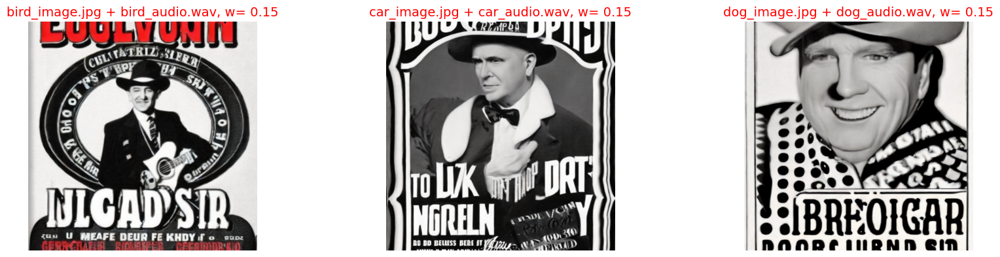

In [39]:
# generate seed image
generator = torch.manual_seed(10)

# generate image
with torch.no_grad():

    image_paths=[".assets/bird_image.jpg", ".assets/car_image.jpg",".assets/dog_image.jpg" ]

    embeddings = model.forward({
        ModalityType.VISION: data.load_and_transform_vision_data(image_paths, device),
    })

    img_embeddings = embeddings[ModalityType.VISION]


    embeddings = model.forward({
        ModalityType.AUDIO: data.load_and_transform_audio_data([out_f], device),
    })
    audio_embeddings = embeddings[ModalityType.AUDIO]

    w = 0.15
    embeddings = img_embeddings * w + audio_embeddings * (1-w)

    gen_images = []

    for emb in embeddings:
        img = pipe(
            image_embeds=emb[None].half(),
            generator = generator
            ).images
        gen_images.append(img[0])

plt.figure(figsize=(20,10))
columns = 3
for i, (image, image_path, audio_path) in enumerate(zip(gen_images, image_paths, audio_paths)):

    name = image_path.split('/')[-1]
    music_name = audio_path.split('/')[-1]

    plt.subplot(int(len(gen_images) / columns + 1), columns, i + 1)
    plt.imshow(image)
    plt.title(f'{name} + {music_name}, w= {w}', fontdict={'fontsize': 14, 'fontweight': 'medium', 'color':'red'})
    plt.axis(False)

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

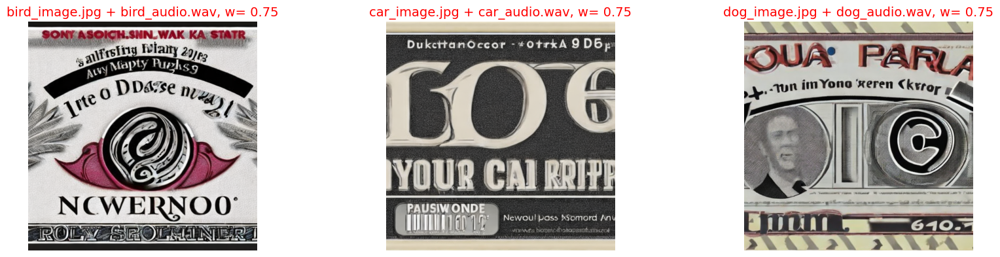

In [38]:
# generate seed image
generator = torch.manual_seed(10)

# generate image
with torch.no_grad():

    image_paths=[".assets/bird_image.jpg", ".assets/car_image.jpg",".assets/dog_image.jpg" ]

    embeddings = model.forward({
        ModalityType.VISION: data.load_and_transform_vision_data(image_paths, device),
    })

    img_embeddings = embeddings[ModalityType.VISION]


    embeddings = model.forward({
        ModalityType.AUDIO: data.load_and_transform_audio_data([out_f], device),
    })
    audio_embeddings = embeddings[ModalityType.AUDIO]

    w = 0.75
    embeddings = img_embeddings * w + audio_embeddings * (1-w)

    gen_images = []

    for emb in embeddings:
        img = pipe(
            image_embeds=emb[None].half(),
            generator = generator
            ).images
        gen_images.append(img[0])

plt.figure(figsize=(20,10))
columns = 3
for i, (image, image_path, audio_path) in enumerate(zip(gen_images, image_paths, audio_paths)):

    name = image_path.split('/')[-1]
    music_name = audio_path.split('/')[-1]

    plt.subplot(int(len(gen_images) / columns + 1), columns, i + 1)
    plt.imshow(image)
    plt.title(f'{name} + {music_name}, w= {w}', fontdict={'fontsize': 14, 'fontweight': 'medium', 'color':'red'})
    plt.axis(False)

## Image to Image

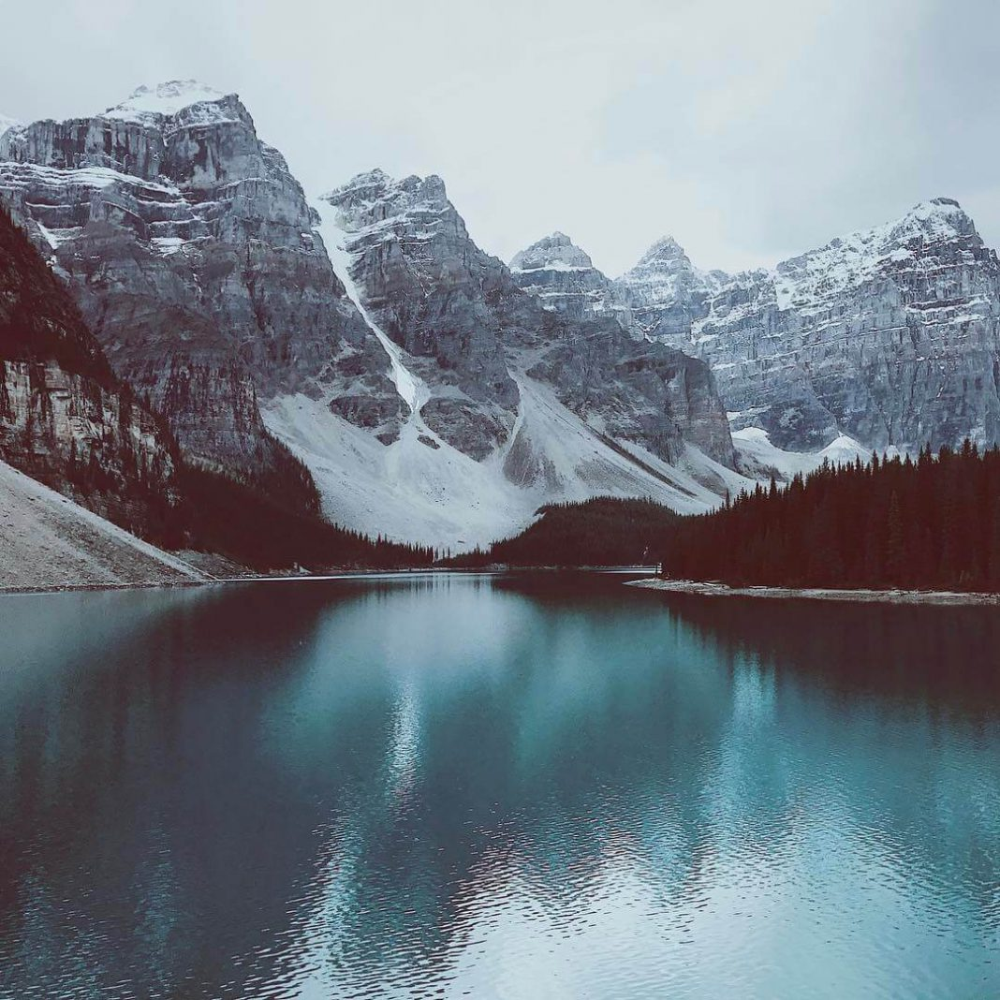

In [41]:
paths=[f"/content/ris-3-1068x1068.jpg"]
display(Image.open(paths[0]))

  0%|          | 0/21 [00:00<?, ?it/s]

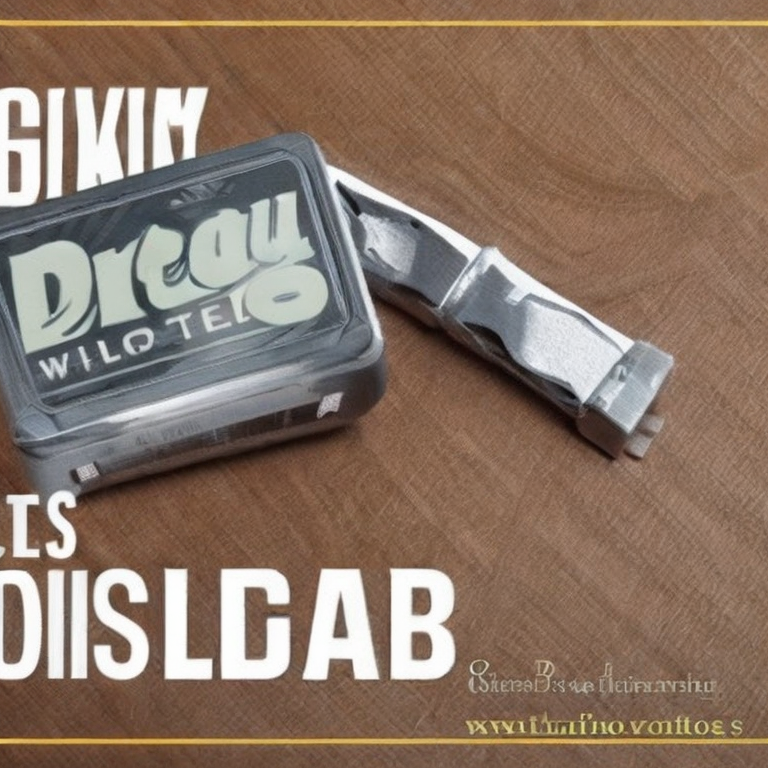

In [44]:
# generate seed image
generator = torch.manual_seed(10)

with torch.no_grad():

    embeddings = model.forward({
        ModalityType.VISION: data.load_and_transform_vision_data(paths, device),
    })
    img_embeddings = embeddings[ModalityType.VISION]
    images = pipe(image_embeds=img_embeddings.half(),
                  generator = generator
    ).images
images[0]

Тут как раз проявляется проблема изображений из интернета, на которыз модель обучена. Тексты имели большой вес в изображениях со страниц сети.